In [1]:
import numpy as np
from hamiltonian import Hamiltonian
from matplotlib import pyplot as plt
from potentials import *
from lasers import sine_square_laser, sine_laser
from cranknicolson import run_CN
from utils import compute_hhg_spectrum
from IPython.display import HTML
import matplotlib.animation as animation

# Interaction with a classical electromagnetic field

The Hamiltonian of an electron interacting with an electromagnetic field given by the vector potential $A(\mathbf{r},t)$, in the Coulomb gauge $\nabla \cdot A(\mathbf{r},t) = 0$, is given by (in atomic units)

\begin{align}
\hat{H}(\mathbf{r},t) &= \frac{1}{2}\left(\hat{p}+A(\mathbf{r},t)\right)^2 + V(\mathbf{r}) \\
 &= -\frac{1}{2}\nabla^2 + A(\mathbf{r},t) \cdot \hat{p} + \frac{1}{2}A(\mathbf{r},t)^2 + V(\mathbf{r}),
\end{align}

Monochromatic plane wave solution of Maxwell's equations
\begin{equation}
A(\mathbf{r},t) = \vec{u} A_0 \sin (\vec{k} \cdot \mathbf{r}-\omega t - \varphi)
\end{equation}
where $\omega$ is the angular frequency (frequency $\nu=\omega/(2\pi)$, wavelength $\lambda=c/\nu$), while $\vec{u}$ 
and $\vec{k}$ are the polarization and propagation vector, respectively.

The corresponding electric field is given by
\begin{equation}
\mathcal{E}(\mathbf{r},t) = -\frac{\partial A(\mathbf{r},t)}{\partial t} =  \vec{u} \mathcal{E}_0 \cos (\vec{k} \cdot \mathbf{r}-\omega t - \varphi),
\end{equation}
where the electric field strength is given by $\mathcal{E}_0 = \omega A_0$.

* In the absence of external sources the scalar potential $\phi=0$ in the Coulomb gauge . 


## Dipole approximation

If the wavelength $\lambda$ of the electric field is large compared with the size of the system, it is common to ignore the spatial variation of the field, the so-called dipole approximation.
\begin{equation}
A(\mathbf{r},t) \approx A(t).
\end{equation}

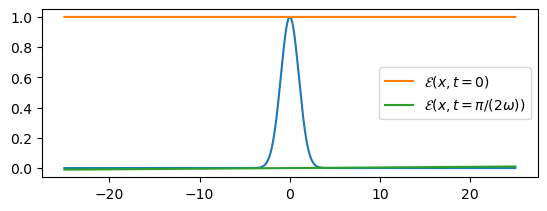

In [2]:
x = np.linspace(-25,25,10001)
omega = 0.057

plt.figure()
plt.subplot(211)
plt.plot(x, np.exp(-x**2/2))
plt.plot(x, np.cos(omega*x/137), label=r'$\mathcal{E}(x,t=0)$')
plt.plot(x, np.sin(omega*x/137), label=r'$\mathcal{E}(x,t=\pi/(2 \omega))$')
plt.legend()
plt.show()

The corresponding Hamiltonian is given by 
\begin{align}
\hat{H}(\mathbf{r},t) &= \frac{1}{2}\left(\hat{p}+A(\mathbf{r},t)\right)^2 + V(\mathbf{r}) \\
 &= -\frac{1}{2}\nabla^2 + A(t) \cdot \hat{p} + \frac{1}{2}A(t)^2 + V(\mathbf{r}).
\end{align}

A gauge transformation yields the length gauge form of the Hamiltonian
\begin{equation}
\hat{H}(\mathbf{r},t) = -\frac{1}{2}\nabla^2 + V(\mathbf{r}) + \mathcal{E}(t) \vec{u} \cdot \mathbf{r}
\end{equation}

Thus, for linear polarization, i.e., $\vec{u} = \vec{e}_x$
\begin{equation}
\hat{H}(\mathbf{r},t) = -\frac{1}{2}\nabla^2 + V(\mathbf{r}) + \mathcal{E}(t) x,
\end{equation}
which we can mimick by the one-dimensional Hamiltonian
\begin{equation}
\hat{H}(x,t) = -\frac{1}{2}\frac{d^2}{dx^2}+ V(x) + \mathcal{E}(t) x.
\end{equation}

Now, the inclusion of the electric field can be incorporated in out program by adding the diagonal matrix
\begin{equation}
X(t) = \mathcal{E}(t)\text{diag}(x_1, \cdots, x_{N_x}),
\end{equation}
to our Hamiltonian matrix.

* For detailed description see for example "Atoms in intense laser fields" by C. J. Joachain: https://doi.org/10.1017/CBO9780511993459

* Introduction to Quantum Optics
From the Semi-classical Approach to Quantized Light: https://www.cambridge.org/core/books/introduction-to-quantum-optics/F45DCE785DC8226D4156EC15CAD5FA9A


In [3]:
n_x = 401
x_max = 10
x = np.linspace(-x_max, x_max, n_x)
dx = x[1] - x[0]

potential = harmonic_oscillator(x, omega=1)
n_eigenstates = 5

hamiltonian = Hamiltonian(x, potential)
eps, psi = hamiltonian.get_eigenstates(n_eigenstates)

In [4]:
E0 = 0.05
omega = eps[1]-eps[0]

t_cycle = 2*np.pi/omega
td = 4*t_cycle

#laser = sine_square_laser(E0, omega, td=td)
laser = sine_laser(E0, omega, td)
hamiltonian.set_electric_field(laser)

dt = 0.01
tfinal = td+t_cycle
psi0 =  psi[:,0].copy()

data = run_CN(hamiltonian, psi0, x, dt, tfinal, psi)

100%|██████████████████████████████████████| 3142/3142 [00:16<00:00, 187.08it/s]


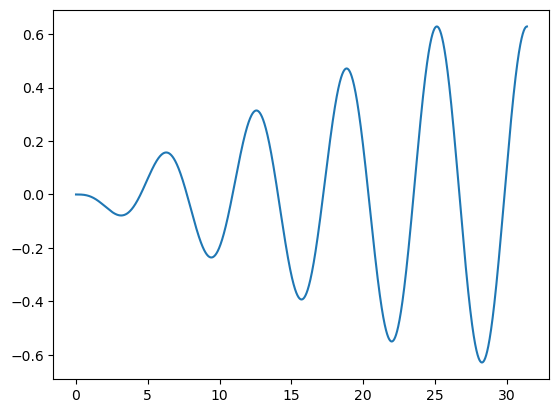

In [5]:
time_points = data["time_points"]
expec_x = data["expec_x"]

plt.figure()
plt.plot(time_points, expec_x.real, label=r"$<x(t)>$")
plt.show()

It is often informative to calculate the popuplation/overlap with some of the eigenstates (if available),
\begin{equation}
p_n(t) = |\langle \Psi(t)|\psi_n \rangle|^2
\end{equation}

* It can be shown that after the electric field is switched off, the populations are constant.

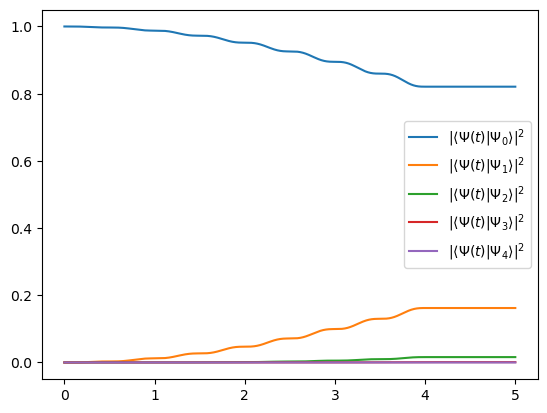

In [6]:
populations = data["populations"]
plt.figure()
for i in range(populations.shape[0]):
    plt.plot(time_points/t_cycle, np.abs(populations[i])**2, label=r"$|\langle \Psi(t)|\Psi_%d \rangle|^2$" % i)
plt.legend()
plt.show()

In [7]:
psi_hist = data["psi_hist"]
num_steps = len(time_points)

fig, ax = plt.subplots()
line, = ax.plot(x, np.abs(psi_hist[0])**2)
#line2, = ax.plot(x, laser(0)*x+potential)
time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes)

def update(frame):
    line.set_ydata(np.abs(psi_hist[10*frame])**2)
    #line2.set_ydata(laser(frame*dt)*x+potential)
    time_text.set_text(f'Time: {10*frame*dt:.2f}')
    return line, time_text

ani = animation.FuncAnimation(fig, update, frames=num_steps//10, interval=100, blit=True)
# Set y limit to 0.5
ax.set_xlim(-6,6)
ax.set_ylim(0, 1.1)
# Save as mp4 file
#ani.save('animation_driven_ho.mp4', writer='ffmpeg')
HTML(ani.to_jshtml())
html = HTML(ani.to_jshtml())
display(html)
plt.close() # update

The harmonic potential theorem    : https://www.nature.com/articles/srep35412   
Thesis Sebastian G. Winther-Larsen: https://www.duo.uio.no/handle/10852/72162  

In [8]:
potential = double_well(x, omega=1, a=1)
n_eigenstates = 5

hamiltonian = Hamiltonian(x, potential)
eps, psi = hamiltonian.get_eigenstates(n_eigenstates)

In [9]:
E0 = 0.05
omega = eps[1]-eps[0]

t_cycle = 2*np.pi/omega
td = 4*t_cycle

laser = sine_laser(E0, omega, td)
hamiltonian.set_electric_field(laser)

dt = 0.01
tfinal = td+t_cycle
psi0 =  psi[:,0].copy()

data = run_CN(hamiltonian, psi0, x, dt, tfinal, psi)

100%|██████████████████████████████████████| 4930/4930 [00:20<00:00, 241.32it/s]


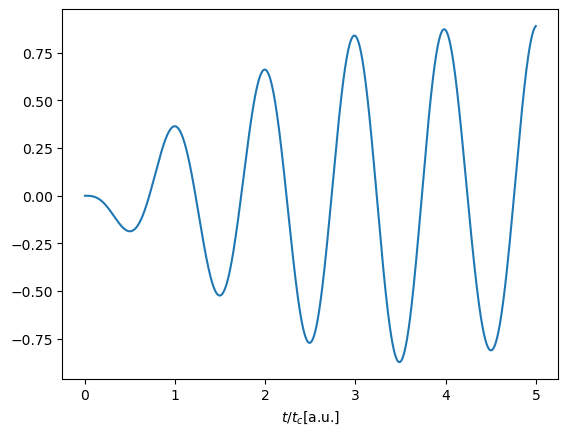

In [10]:
time_points = data["time_points"]
expec_x = data["expec_x"]

plt.figure()
plt.plot(time_points/t_cycle, expec_x.real, label=r"$<x(t)>$")
plt.xlabel(r'$t/t_c$[a.u.]')
plt.show()

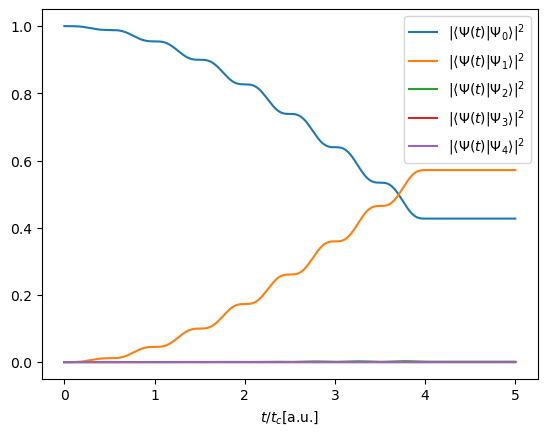

In [11]:
populations = data["populations"]
plt.figure()
for i in range(populations.shape[0]):
    plt.plot(time_points/t_cycle, np.abs(populations[i])**2, label=r"$|\langle \Psi(t)|\Psi_%d \rangle|^2$" % i)
plt.legend()
plt.xlabel(r'$t/t_c$[a.u.]')
plt.show()

In [12]:
psi_hist = data["psi_hist"]
num_steps = len(time_points)

fig, ax = plt.subplots()
line, = ax.plot(x, np.abs(psi_hist[0])**2)
#line2, = ax.plot(x, laser(0)*x+potential)
time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes)

def update(frame):
    line.set_ydata(np.abs(psi_hist[10*frame])**2)
    #line2.set_ydata(laser(frame*dt)*x+potential)
    time_text.set_text(f'Time: {10*frame*dt:.2f}')
    return line, time_text

ani = animation.FuncAnimation(fig, update, frames=num_steps//10, interval=100, blit=True)
# Set y limit to 0.5
ax.set_xlim(-6,6)
ax.set_ylim(0, 1.1)
# Save as mp4 file
#ani.save('animation_driven_dw.mp4', writer='ffmpeg')
HTML(ani.to_jshtml())
html = HTML(ani.to_jshtml())
display(html)
plt.close() # update